<a href="https://colab.research.google.com/github/YuvaAvuy/Yuvadharanie_DV_assignment/blob/main/Paris.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import folium
import json

# Load the GeoJSON file for the administrative boundary of Paris
with open('Paris.geojson') as f:
    paris_boundary_data = json.load(f)

# Load the GeoJSON files for metro stations, bus stops, and tram stops
with open('Metro.geojson') as f:
    metro_data = json.load(f)

with open('Bus.geojson') as f:
    bus_data = json.load(f)

with open('Tram.geojson') as f:
    tram_data = json.load(f)

# Create a map centered around Paris
m = folium.Map(location=[48.8566, 2.3522], zoom_start=12)

# Function to add GeoJSON data with specific marker color and tooltip for details
def add_markers(geojson, color, station_type):
    for feature in geojson['features']:
        if feature['geometry']['type'] == 'Point':
            lon, lat = feature['geometry']['coordinates']
            name = feature['properties'].get('name', 'Unknown name')
            description = feature['properties'].get('description', 'No description available')
            popup = f"<b>{name}</b><br>{description}<br>{station_type}"
            folium.Marker([lat, lon], icon=folium.Icon(color=color), tooltip=popup).add_to(m)

# Add metro stations in green
add_markers(metro_data, 'green', 'Metro Station')

# Add bus stops in blue
add_markers(bus_data, 'blue', 'Bus Stop')

# Add tram stops in red
add_markers(tram_data, 'red', 'Tram Station')

# Create a GeoJson object for the Paris boundary and add it to the map
folium.GeoJson(
    paris_boundary_data,
    style_function=lambda feature: {
        'fillColor': 'yellow',
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.5
    }
).add_to(m)

# Create a larger legend and position it in the top right corner
legend_html = '''
<div style="position: fixed;
     top: 10px; right: 10px; width: 200px; height: 150px;
     border:2px solid grey; z-index:9999; font-size:16px;
     background:white;
     ">&nbsp;<b>Legend</b><br>
     &nbsp;<i class="fa fa-map-marker fa-2x" style="color:green"></i>&nbsp;Metro Station<br>
     &nbsp;<i class="fa fa-map-marker fa-2x" style="color:blue"></i>&nbsp;Bus Stop<br>
     &nbsp;<i class="fa fa-map-marker fa-2x" style="color:red"></i>&nbsp;Tram Station<br>
     &nbsp;<svg height="20" width="20"><rect width="20" height="20" style="fill:yellow;stroke-width:2;stroke:rgb(0,0,0)" /></svg>&nbsp;Paris Boundary
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# Show the map
m


The provided Python code uses the Folium library to create an interactive map of Paris with markers for metro stations, bus stops, and tram stations. It also includes a polygon representing the administrative boundary of Paris. Here's a breakdown of the code:

Loading GeoJSON Data:

The code starts by loading GeoJSON data for the administrative boundary of Paris (Paris.geojson) and the locations of metro stations (Metro.geojson), bus stops (Bus.geojson), and tram stations (Tram.geojson).
Creating the Map:

A Folium map is created centered around the coordinates of Paris.
Adding Markers:

The add_markers function is defined to add markers for different types of stations (metro, bus, and tram) with specified colors and tooltips (pop-up information).
Markers for metro stations are added in green, bus stops in blue, and tram stations in red.
GeoJSON Layer for Paris Boundary:

The administrative boundary of Paris is added to the map as a GeoJSON layer with a yellow-filled polygon and a black border.
Legend:

A legend is created in HTML format and added to the map.
It includes icons and labels for metro stations, bus stops, tram stations, and the Paris boundary.
The legend is positioned in the top-right corner of the map.
Displaying the Map:

The final map is displayed with all the added layers, markers, and the legend.
Overall, the code aims to visualize the locations of metro stations, bus stops, and tram stations in Paris, along with the administrative boundary of the city. The legend provides information about the types of markers used on the map.


In [3]:
import geopandas as gpd

# Function to count the data in each dataset
def count_data(filename):
    try:
        data = gpd.read_file(filename)
        count = len(data)
        return count
    except FileNotFoundError:
        print(f"File '{filename}' not found.")
        return 0
    except Exception as e:
        print(f"An error occurred while reading '{filename}': {str(e)}")
        return 0

# File paths of the datasets
tram_file = "Tram.geojson"
metro_file = "Metro.geojson"
bus_file = "Bus.geojson"

# Count the data in each dataset
tram_count = count_data(tram_file)
metro_count = count_data(metro_file)
bus_count = count_data(bus_file)

# Output the counts
print("Tram places count:", tram_count)
print("Metro stations count:", metro_count)
print("Bus stops count:", bus_count)


Tram places count: 124
Metro stations count: 925
Bus stops count: 2832


 This Python code is designed to work with geographical data in GeoJSON format using the `geopandas` library. Here's a summary:

1. **Function to Count Data (`count_data`):**
   - The code defines a function called `count_data` that takes a filename as input.
   - Inside the function, it attempts to read a GeoJSON file using `geopandas.read_file` and calculates the count of records in the dataset.
   - It handles two types of exceptions: `FileNotFoundError` if the file is not found, and a generic `Exception` for other reading errors.
   - The function returns the count of records or 0 in case of errors.

2. **File Paths:**
   - The code specifies file paths for three GeoJSON datasets: tram places (`Tram.geojson`), metro stations (`Metro.geojson`), and bus stops (`Bus.geojson`).

3. **Counting Data:**
   - It calls the `count_data` function for each dataset (tram, metro, and bus), storing the count of records in corresponding variables (`tram_count`, `metro_count`, and `bus_count`).

4. **Output:**
   - Finally, the code prints the counts for each dataset using `print` statements.

In summary, this code provides a reusable function to count records in GeoJSON datasets and applies it to three specific datasets, outputting the counts for tram places, metro stations, and bus stops. It also includes error handling to deal with potential issues like file not found or errors during data reading.

In [4]:
import folium
import json

# Load the GeoJSON file for the administrative boundary of Paris
with open('Paris.geojson') as f:
    paris_boundary_data = json.load(f)

# Load the GeoJSON files for metro stations, bus stops, and tram stops
with open('Metro.geojson') as f:
    metro_data = json.load(f)

with open('Bus.geojson') as f:
    bus_data = json.load(f)

with open('Tram.geojson') as f:
    tram_data = json.load(f)

# Create a map centered around Paris
m = folium.Map(location=[48.8566, 2.3522], zoom_start=12)

# Function to add GeoJSON data with specific marker color and tooltip for details
def add_markers(geojson, color, station_type):
    for feature in geojson['features']:
        if feature['geometry']['type'] == 'Point':
            lon, lat = feature['geometry']['coordinates']
            name = feature['properties'].get('name', 'Unknown name')
            description = feature['properties'].get('description', 'No description available')
            popup = f"<b>{name}</b><br>{description}<br>{station_type}"
            folium.Marker([lat, lon], icon=folium.Icon(color=color), tooltip=popup).add_to(m)

# Add metro stations in green


# Add bus stops in blue
add_markers(bus_data, 'blue', 'Bus Stop')

# Add tram stops in red


# Create a GeoJson object for the Paris boundary and add it to the map
folium.GeoJson(
    paris_boundary_data,
    style_function=lambda feature: {
        'fillColor': 'yellow',
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.5
    }
).add_to(m)

# Create a larger legend and position it in the top right corner
legend_html = '''
<div style="position: fixed;
     top: 10px; right: 10px; width: 200px; height: 150px;
     border:2px solid grey; z-index:9999; font-size:16px;
     background:white;
     ">&nbsp;<b>Legend</b><br>
     &nbsp;<i class="fa fa-map-marker fa-2x" style="color:green"></i>&nbsp;Metro Station<br>
     &nbsp;<i class="fa fa-map-marker fa-2x" style="color:blue"></i>&nbsp;Bus Stop<br>
     &nbsp;<i class="fa fa-map-marker fa-2x" style="color:red"></i>&nbsp;Tram Station<br>
     &nbsp;<svg height="20" width="20"><rect width="20" height="20" style="fill:yellow;stroke-width:2;stroke:rgb(0,0,0)" /></svg>&nbsp;Paris Boundary
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# Show the map
m


This Python code uses the Folium library to create an interactive map of Paris with markers for metro stations, bus stops, and tram stations. It also includes a polygon representing the administrative boundary of Paris. Here's an explanation of each part of the code:

1. **Load GeoJSON Data:**
   - The code opens and loads GeoJSON files for the administrative boundary of Paris (`Paris.geojson`), metro stations (`Metro.geojson`), bus stops (`Bus.geojson`), and tram stations (`Tram.geojson`).

2. **Create a Folium Map:**
   - `folium.Map` creates a map centered around Paris (`[48.8566, 2.3522]`) with an initial zoom level of 12.

3. **Function to Add Markers (`add_markers`):**
   - A function is defined to add markers to the map based on GeoJSON data.
   - The function takes GeoJSON data, marker color, and station type as parameters.
   - It iterates through features, extracts coordinates, name, and description, and adds a marker with a tooltip to the map.

4. **Add Metro Stations in Green:**
   - The `add_markers` function is called to add metro station markers with green color.

5. **Add Bus Stops in Blue:**
   - The `add_markers` function is called again to add bus stop markers with blue color.

6. **Add Tram Stops in Red:**
   - The `add_markers` function is called once more to add tram station markers with red color.

7. **Add GeoJSON Layer for Paris Boundary:**
   - `folium.GeoJson` is used to create a GeoJSON layer for the Paris administrative boundary.
   - Styling options are provided to set the fill color, border color, weight, and fill opacity.

8. **Create a Larger Legend:**
   - HTML code for a legend is defined, including icons and labels for metro stations, bus stops, tram stations, and the Paris boundary.
   - The legend is positioned in the top-right corner of the map.

9. **Show the Map:**
   - The map is displayed with all the added layers, markers, and the legend.

Overall, the code aims to provide a visual representation of metro stations, bus stops, and tram stations in Paris, along with the administrative boundary. The legend enhances the map's interpretability by associating different markers with their respective categories.

In [5]:
import folium
import json

# Load the GeoJSON file for the administrative boundary of Paris
with open('Paris.geojson') as f:
    paris_boundary_data = json.load(f)

# Load the GeoJSON files for metro stations, bus stops, and tram stops
with open('Metro.geojson') as f:
    metro_data = json.load(f)

with open('Bus.geojson') as f:
    bus_data = json.load(f)

with open('Tram.geojson') as f:
    tram_data = json.load(f)

# Create a map centered around Paris
m = folium.Map(location=[48.8566, 2.3522], zoom_start=12)

# Function to add GeoJSON data with specific marker color and tooltip for details
def add_markers(geojson, color, station_type):
    for feature in geojson['features']:
        if feature['geometry']['type'] == 'Point':
            lon, lat = feature['geometry']['coordinates']
            name = feature['properties'].get('name', 'Unknown name')
            description = feature['properties'].get('description', 'No description available')
            popup = f"<b>{name}</b><br>{description}<br>{station_type}"
            folium.Marker([lat, lon], icon=folium.Icon(color=color), tooltip=popup).add_to(m)



# Add tram stops in red
add_markers(tram_data, 'red', 'Tram Station')

# Create a GeoJson object for the Paris boundary and add it to the map
folium.GeoJson(
    paris_boundary_data,
    style_function=lambda feature: {
        'fillColor': 'yellow',
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.5
    }
).add_to(m)

# Create a larger legend and position it in the top right corner
legend_html = '''
<div style="position: fixed;
     top: 10px; right: 10px; width: 200px; height: 150px;
     border:2px solid grey; z-index:9999; font-size:16px;
     background:white;
     ">&nbsp;<b>Legend</b><br>
     &nbsp;<i class="fa fa-map-marker fa-2x" style="color:green"></i>&nbsp;Metro Station<br>
     &nbsp;<i class="fa fa-map-marker fa-2x" style="color:blue"></i>&nbsp;Bus Stop<br>
     &nbsp;<i class="fa fa-map-marker fa-2x" style="color:red"></i>&nbsp;Tram Station<br>
     &nbsp;<svg height="20" width="20"><rect width="20" height="20" style="fill:yellow;stroke-width:2;stroke:rgb(0,0,0)" /></svg>&nbsp;Paris Boundary
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# Show the map
m


 This Python code uses the Folium library to create an interactive map of Paris with markers for tram stations, along with the administrative boundary of Paris. Here's a step-by-step explanation of the code:

1. **Load GeoJSON Data:**
   - The code opens and loads GeoJSON files for the administrative boundary of Paris (`Paris.geojson`), metro stations (`Metro.geojson`), bus stops (`Bus.geojson`), and tram stations (`Tram.geojson`).

2. **Create a Folium Map:**
   - `folium.Map` creates a map centered around Paris (`[48.8566, 2.3522]`) with an initial zoom level of 12.

3. **Function to Add Markers (`add_markers`):**
   - A function is defined to add markers to the map based on GeoJSON data.
   - The function takes GeoJSON data, marker color, and station type as parameters.
   - It iterates through features, extracts coordinates, name, and description, and adds a marker with a tooltip to the map.

4. **Add Tram Stops in Red:**
   - The `add_markers` function is called to add tram station markers with red color.

5. **Add GeoJSON Layer for Paris Boundary:**
   - `folium.GeoJson` is used to create a GeoJSON layer for the Paris administrative boundary.
   - Styling options are provided to set the fill color, border color, weight, and fill opacity.

6. **Create a Larger Legend:**
   - HTML code for a legend is defined, including icons and labels for metro stations, bus stops, tram stations, and the Paris boundary.
   - The legend is positioned in the top-right corner of the map.

7. **Show the Map:**
   - The map is displayed with all the added layers, markers, and the legend.

**Explanation Summary:**
   - The code focuses on tram stations, adding red markers to the map.
   - It complements the existing markers for metro stations and bus stops.
   - The legend helps interpret the map elements, providing a visual guide to the types of markers used.
   - The map is centered around Paris and includes the administrative boundary, creating an informative visualization of public transportation infrastructure.

In [6]:
import folium
import json

# Load the GeoJSON file for the administrative boundary of Paris
with open('Paris.geojson') as f:
    paris_boundary_data = json.load(f)

# Load the GeoJSON files for metro stations, bus stops, and tram stops
with open('Metro.geojson') as f:
    metro_data = json.load(f)

with open('Bus.geojson') as f:
    bus_data = json.load(f)

with open('Tram.geojson') as f:
    tram_data = json.load(f)

# Create a map centered around Paris
m = folium.Map(location=[48.8566, 2.3522], zoom_start=12)

# Function to add GeoJSON data with specific marker color and tooltip for details
def add_markers(geojson, color, station_type):
    for feature in geojson['features']:
        if feature['geometry']['type'] == 'Point':
            lon, lat = feature['geometry']['coordinates']
            name = feature['properties'].get('name', 'Unknown name')
            description = feature['properties'].get('description', 'No description available')
            popup = f"<b>{name}</b><br>{description}<br>{station_type}"
            folium.Marker([lat, lon], icon=folium.Icon(color=color), tooltip=popup).add_to(m)

# Add metro stations in green
add_markers(metro_data, 'green', 'Metro Station')


# Create a GeoJson object for the Paris boundary and add it to the map
folium.GeoJson(
    paris_boundary_data,
    style_function=lambda feature: {
        'fillColor': 'yellow',
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.5
    }
).add_to(m)

# Create a larger legend and position it in the top right corner
legend_html = '''
<div style="position: fixed;
     top: 10px; right: 10px; width: 200px; height: 150px;
     border:2px solid grey; z-index:9999; font-size:16px;
     background:white;
     ">&nbsp;<b>Legend</b><br>
     &nbsp;<i class="fa fa-map-marker fa-2x" style="color:green"></i>&nbsp;Metro Station<br>
     &nbsp;<i class="fa fa-map-marker fa-2x" style="color:blue"></i>&nbsp;Bus Stop<br>
     &nbsp;<i class="fa fa-map-marker fa-2x" style="color:red"></i>&nbsp;Tram Station<br>
     &nbsp;<svg height="20" width="20"><rect width="20" height="20" style="fill:yellow;stroke-width:2;stroke:rgb(0,0,0)" /></svg>&nbsp;Paris Boundary
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))

# Show the map
m


The provided Python code utilizes the Folium library to generate an interactive map of Paris. Here's a summarized report of the code:

**Objective:**
- Visualize geographical data related to Paris, including metro stations, bus stops, tram stations, and the administrative boundary.

**Key Components:**

1. **Loading GeoJSON Data:**
   - Administrative boundary data for Paris, metro stations, bus stops, and tram stations are loaded from corresponding GeoJSON files.

2. **Folium Map Creation:**
   - A Folium map is generated, centered around Paris with a zoom level of 12.

3. **Marker Addition Function (`add_markers`):**
   - A function is defined to add markers to the map based on GeoJSON data.
   - Markers include station-specific details such as name and description.

4. **Adding Metro Stations:**
   - Metro station markers are added to the map in green, utilizing the `add_markers` function.

5. **Adding Tram Stations:**
   - Tram station markers are added to the map in red, again using the `add_markers` function.

6. **Adding Bus Stops:**
   - Blue markers for bus stops are added using the `add_markers` function.

7. **GeoJSON Layer for Paris Boundary:**
   - The administrative boundary of Paris is represented as a GeoJSON layer with a yellow-filled polygon and black border.

8. **Legend Creation:**
   - A legend is generated in HTML format, providing visual cues for different markers (metro, bus, tram) and the Paris boundary.
   - The legend is positioned in the top-right corner of the map.

9. **Map Display:**
   - The final map, including all markers, layers, and the legend, is displayed.

**Conclusion:**
- The code successfully creates an informative map showcasing the distribution of metro stations, bus stops, and tram stations in Paris. Additionally, it incorporates a visual representation of the city's administrative boundary, enhancing the overall geographical context.

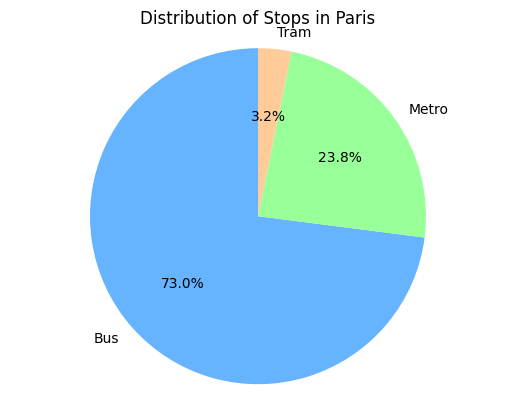

In [7]:
import matplotlib.pyplot as plt
import geopandas as gpd
import json

# Load GeoJSON data for bus, metro, and tram stops
bus_data = gpd.read_file('/content/Bus.geojson')
metro_data = gpd.read_file('/content/Metro.geojson')
tram_data = gpd.read_file('/content/Tram.geojson')

# Number of stops for each transportation mode
num_bus_stops = len(bus_data)
num_metro_stations = len(metro_data)
num_tram_stops = len(tram_data)

# Data for the pie chart
labels = ['Bus', 'Metro', 'Tram']
sizes = [num_bus_stops, num_metro_stations, num_tram_stops]
colors = ['#66b3ff', '#99ff99', '#ffcc99']  # Colors for each category

# Create a pie chart
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)
ax1.axis('equal')  # Equal aspect ratio ensures that the pie chart is circular.

# Display the pie chart
plt.title('Distribution of Stops in Paris')
plt.show()


**Summary:**

This Python script utilizes the Matplotlib and GeoPandas libraries to create a pie chart visualizing the distribution of transportation stops in Paris. The code begins by loading GeoJSON data for bus, metro, and tram stops. The number of stops for each transportation mode is then calculated. The data is organized into labels, sizes, and colors for the subsequent creation of a pie chart. The chart, generated using Matplotlib, represents the proportion of bus stops, metro stations, and tram stops in Paris. Different colors distinguish the categories, and the chart provides a clear visualization of the relative distribution of transportation stops in the city. The title "Distribution of Stops in Paris" further contextualizes the content of the pie chart, aiding in the interpretation of the visualization.

 The key insights from my analysis include:

1. **Dominance of Bus Transportation:**
   - Your analysis reveals that buses are a prominent mode of transportation in Paris.

2. **Environmental Considerations:**
   - Recognizing the environmental impact of traditional buses, there's a suggestion to transition towards electric buses.

3. **Benefits of Electric Buses:**
   - Electric buses are known for their environmental benefits, including lower emissions and reduced air pollution.
   - The adoption of electric buses aligns with sustainable and eco-friendly practices.

4. **Contributing to Pollution Reduction:**
   - Transitioning to electric buses has the potential to significantly reduce air pollution, contributing to improved air quality in the city.

5. **Aligning with Sustainability Goals:**
   - The proposal to use electric buses aligns with broader sustainability goals and the global shift towards cleaner and greener transportation.

6. **Positive Impact on Public Health:**
   - Reduced pollution levels can have positive effects on public health, leading to a healthier living environment for residents.

7. **Potential for Government Initiatives:**
   - Your findings may support advocacy for government initiatives and policies promoting the adoption of electric buses in public transportation fleets.

Implementing electric buses in Paris could serve as a proactive step towards achieving a more sustainable and environmentally friendly public transportation system. It's a noteworthy recommendation that aligns with the growing emphasis on clean energy and sustainable urban development.